# **Dilation, Erosion and Edge Detection**
- Morphological operations are used to extract the region, edges, shapes, etc.
- Morphological operations are performed on binary images. Binary images may contain a lot of imperfections. 
- Especially the binary image that is produced by some simple thresholding operations (if you are not familiar with thresholding, don’t worry about it now) may contain a lot of noise and distortions. 
- Different morphological operations are available in the OpenCV library to handle those noises and imperfections.

####**In this lesson we'll learn:**
1. Dilation
2. Erosion
3. Opening
4. Closing
5. Canny Edge Detection

# **Great Blogs:**
- https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html 
  (Examples)
- https://pyimagesearch.com/2014/11/24/detecting-barcodes-images-python-opencv/ (Barcode Detection)
- https://pythonprogramming.net/morphological-transformation-python-opencv-tutorial/ (Red Cap Detection)
- https://www.ccoderun.ca/programming/doxygen/opencv/tutorial_morph_lines_detection.html (Horizontal , Vertical Lines detector)
- https://towardsdatascience.com/image-processing-part-3-dbf103622909 (Theory)
- https://www.kaggle.com/code/volkandl/opencv-for-computer-vision-4-morphology

In [6]:
# Our Setup, Import Libaries, Create our Imshow Function and Download our Images
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function 
def imshow(title = "Image", image = None, size = 10):
    h,w = image.shape[0], image.shape[1]
    aspect_ratio = h/w
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

# Download and unzip our images
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
!unzip -qq images.zip

--2023-05-01 07:08:29--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.142.70
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|52.95.142.70|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29586716 (28M) [application/zip]
Saving to: ‘images.zip.1’

images.zip.1        100%[===================>]  28.22M  16.0MB/s    in 1.8s    

2023-05-01 07:08:31 (16.0 MB/s) - ‘images.zip.1’ saved [29586716/29586716]

replace images/castara.jpeg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


- **Dilation** – Adds pixels to the boundaries of objects in an image
- **Erosion** – Removes pixels at the boundaries of objects in an image
- **Opening** - Erosion followed by dilation
- **Closing** - Dilation followed by erosion 

![](https://github.com/rajeevratan84/ModernComputerVision/raw/main/Screenshot%202021-11-15%20at%205.19.08%20pm.png)

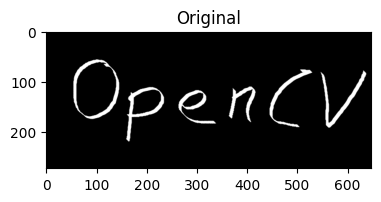

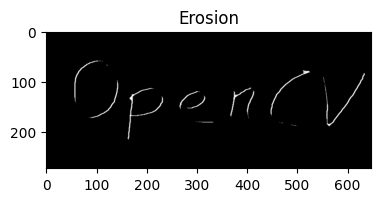

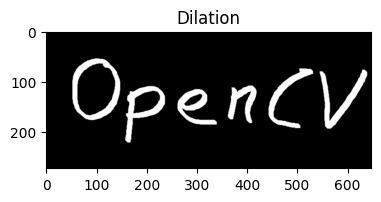

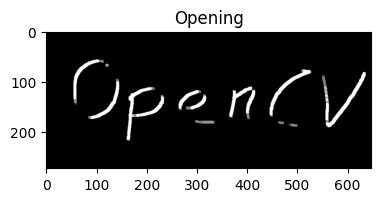

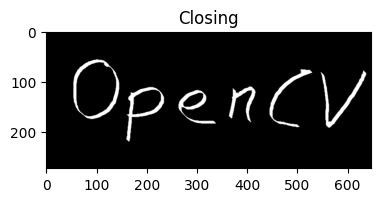

In [ ]:
import cv2
import numpy as np

image = cv2.imread('images/opencv_inv.png', 0)
imshow('Original', image)

# Let's define our kernel size
kernel = np.ones((5,5), np.uint8)

# Now we erode
erosion = cv2.erode(image, kernel, iterations = 1)
imshow('Erosion', erosion)

# Dilate here
dilation = cv2.dilate(image, kernel, iterations = 1)
imshow('Dilation', dilation)

# Opening - Good for removing noise
opening = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
imshow('Opening',opening)

# Closing - Good for removing noise
closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
imshow('Closing',closing)

### **Another way of applying Morphological Operation:**


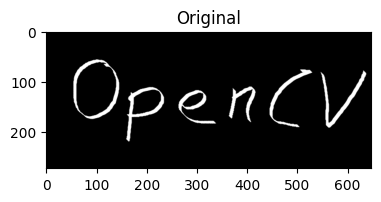

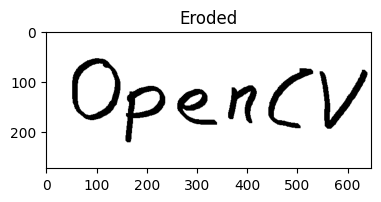

In [ ]:
# read the image
img = cv2.imread('images/opencv_inv.png', 0)
  
# binarize the image
binr = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
  
# define the kernel
kernel = np.ones((5, 5), np.uint8)
  
# invert the image
invert = cv2.bitwise_not(binr)
  
# erode the image
erosion = cv2.erode(invert, kernel,
                    iterations=1)
  
# print the output
imshow('Original',img)
imshow('Eroded',erosion)

### **Edge Detection:**
- Edge detection is an image-processing technique that is used to identify the boundaries (edges) of objects or regions within an image. 
- Edges are among the most important features associated with images. We know the underlying structure of an image through its edges.
- Sudden changes in pixel intensity characterize edges. We need to look for such changes in the neighboring pixels to detect edges. 
- Let’s explore using two important edge-detection algorithms available in OpenCV: **Sobel Edge Detection and Canny Edge Detection**.

### **Sobel Detector:**
- ```Sobel(src, ddepth, dx, dy)```

- The parameter **ddepth** specifies the precision of the output image, while dx and dy specify the order of the derivative in each direction. For example:

 - If dx=1 and dy=0, we compute the 1st derivative Sobel image in the x-direction.
 - If both dx=1 and dy=1, we compute the 1st derivative Sobel image in both directions

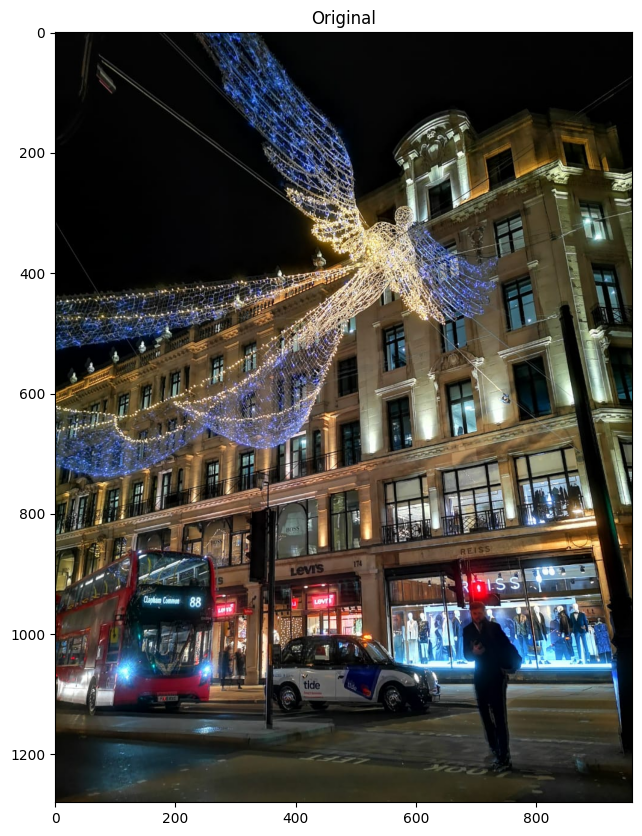

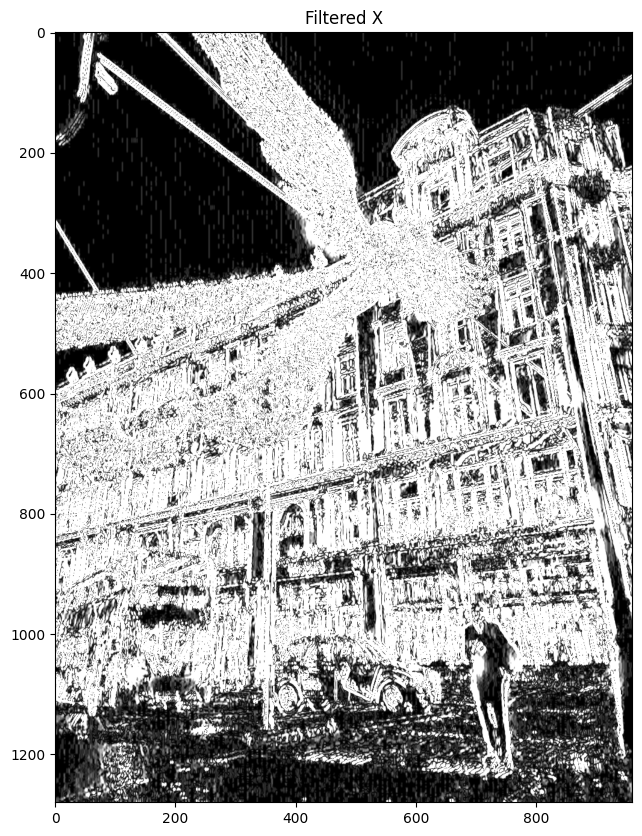

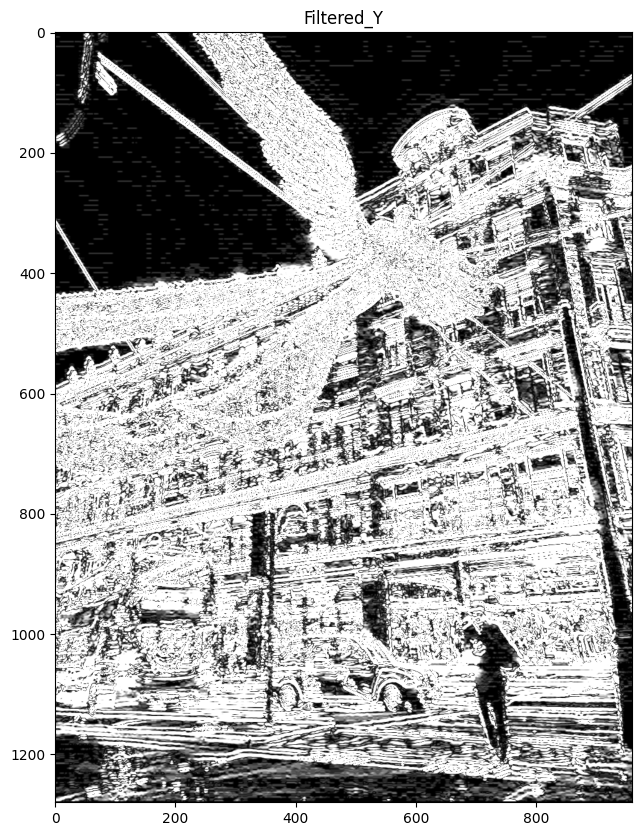

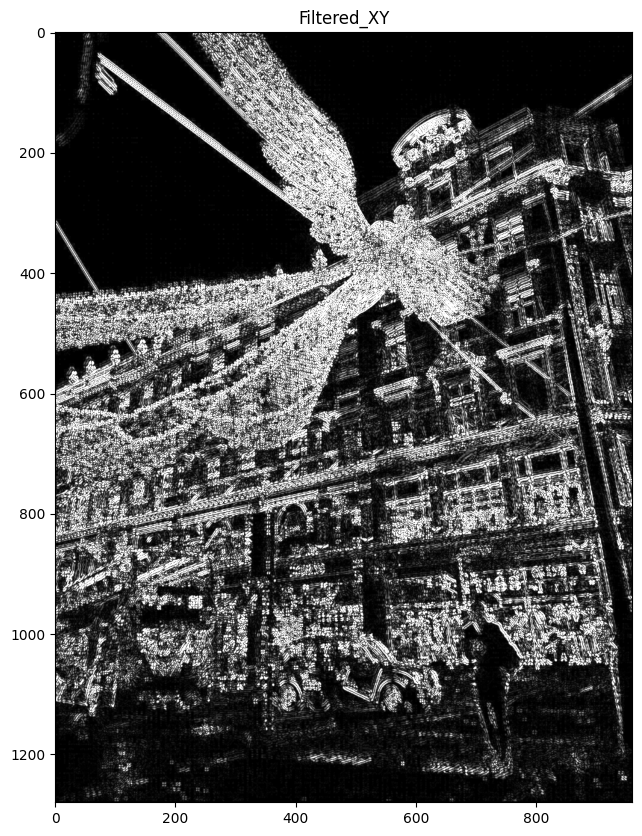

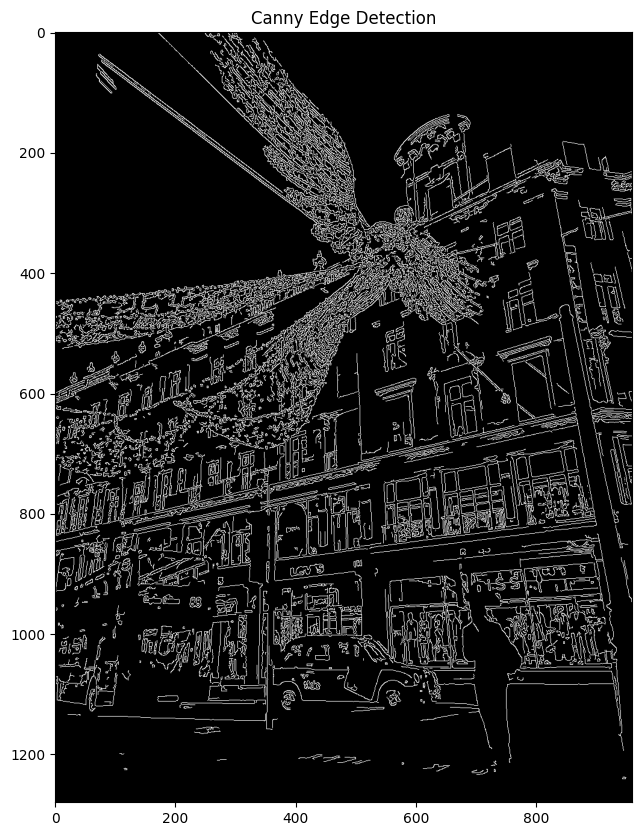

In [12]:
from google.colab.patches import cv2_imshow
# Read the original image
img = cv2.imread('images/londonxmas.jpeg') 
# Display original image
imshow('Original', img)

 
# Convert to graycsale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(img_gray, (3,3), 0) 
 
# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
filtered_image_x = cv2.convertScaleAbs(sobelx)

sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
filtered_image_y = cv2.convertScaleAbs(sobely)

sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection
filtered_image_xy = cv2.convertScaleAbs(sobelxy)
# Display Sobel Edge Detection Images
imshow('Filtered X',filtered_image_x)
imshow('Filtered_Y',filtered_image_y)
imshow('Filtered_XY',filtered_image_xy)

 
# Canny Edge Detection
edges = cv2.Canny(image=img_blur, threshold1=100, threshold2=200) # Canny Edge Detection
# Display Canny Edge Detection Image
imshow('Canny Edge Detection', edges)

## **Canny Edge Detection** 
![](https://github.com/rajeevratan84/ModernComputerVision/raw/main/Screenshot%202021-11-15%20at%205.24.15%20pm.png)

- The first argument is our input image.
- The second and third arguments are our minVal and maxVal respectively. 
- The forth argument is aperture_size. It is the size of Sobel kernel used for find image gradients. By default it is 3. 

Edge detection needs a threshold to tell what difference/change should be counted as edge

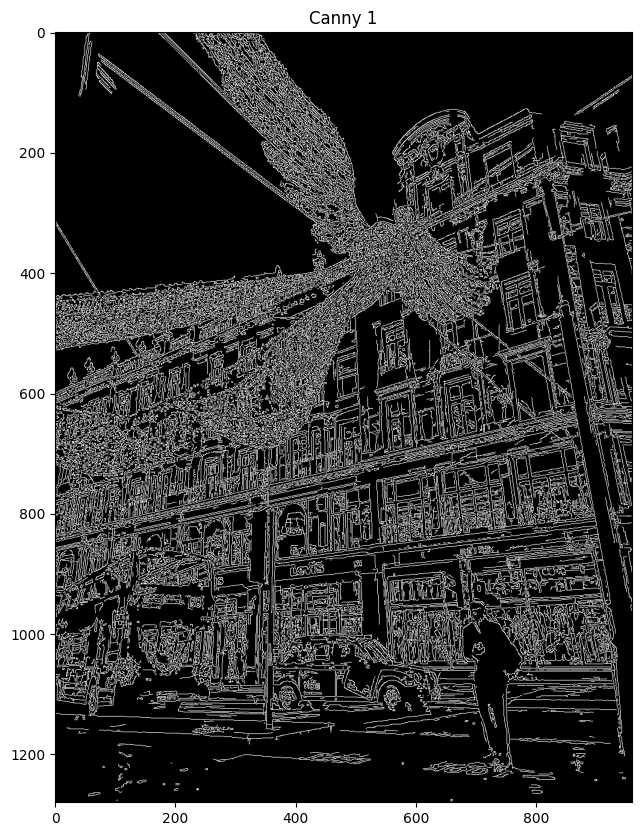

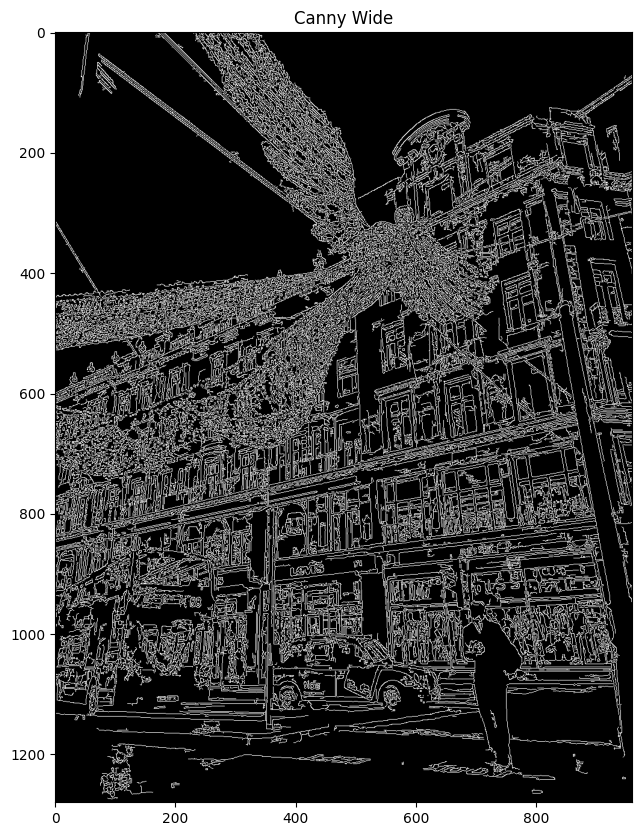

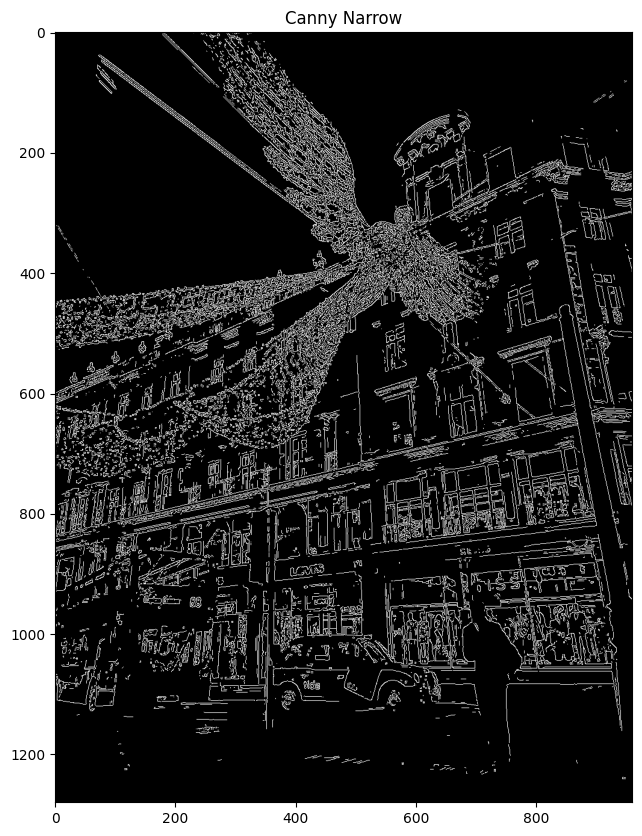

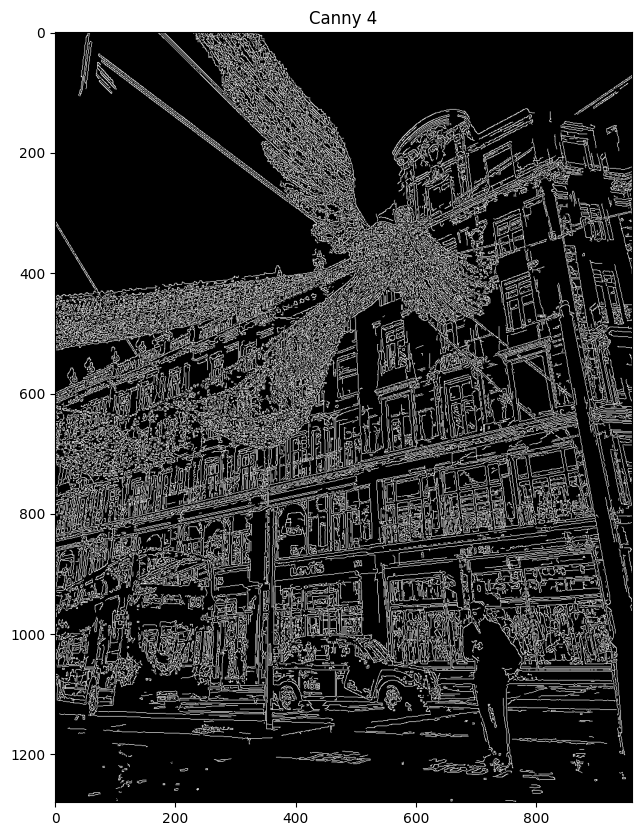

In [ ]:
image = cv2.imread('images/londonxmas.jpeg',0)

# Canny Edge Detection uses gradient values as thresholds
# The first threshold gradient
canny = cv2.Canny(image, 50, 120)
imshow('Canny 1', canny)

# Wide edge thresholds expect lots of edges
canny = cv2.Canny(image, 10, 200)
imshow('Canny Wide', canny)

# Narrow threshold, expect less edges 
canny = cv2.Canny(image, 200, 240)
imshow('Canny Narrow', canny)

canny = cv2.Canny(image, 60, 110)
imshow('Canny 4', canny)

##  Then, we need to provide two values: threshold1 and threshold2. Any gradient value larger than threshold2
# is considered to be an edge. Any value below threshold1 is considered not to be an edge. 
#Values in between threshold1 and threshold2 are either classiﬁed as edges or non-edges based on how their 
#intensities are “connected”. In this case, any gradient values below 60 are considered non-edges
#whereas any values above 120 are considered edges.

#### **Auto Canny**

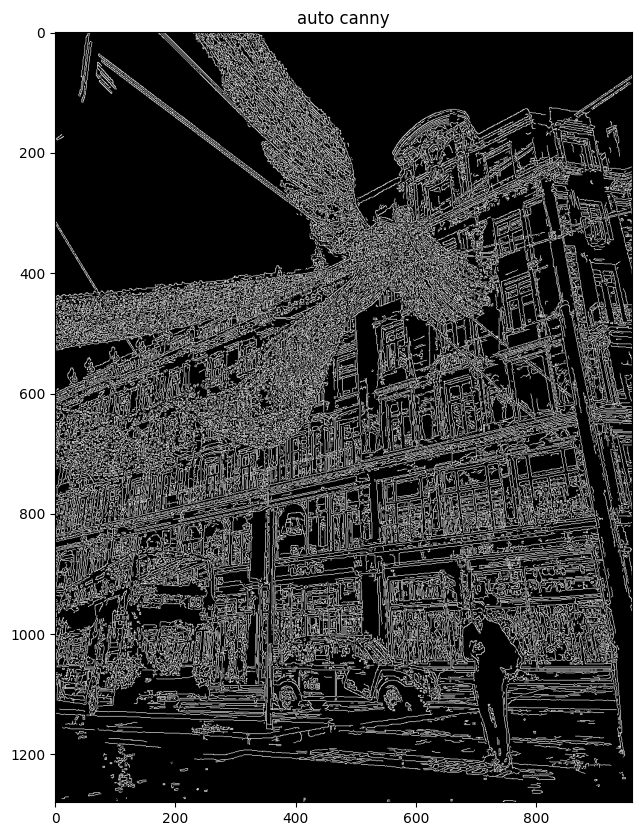

In [ ]:
def autoCanny(image):
  # Finds optimal thresholds based on median image pixel intensity
  blurred_img = cv2.blur(image, ksize=(5,5))
  med_val = np.median(image) 
  lower = int(max(0, 0.66 * med_val))
  upper = int(min(255, 1.33 * med_val))
  edges = cv2.Canny(image=image, threshold1=lower, threshold2=upper)
  return edges

auto_canny = autoCanny(image)
imshow("auto canny", auto_canny)

### **Laplacian edge detector**
- The Laplacian edge detector compares an image’s second derivatives. It counts the number of times the first derivative changes in a single pass.

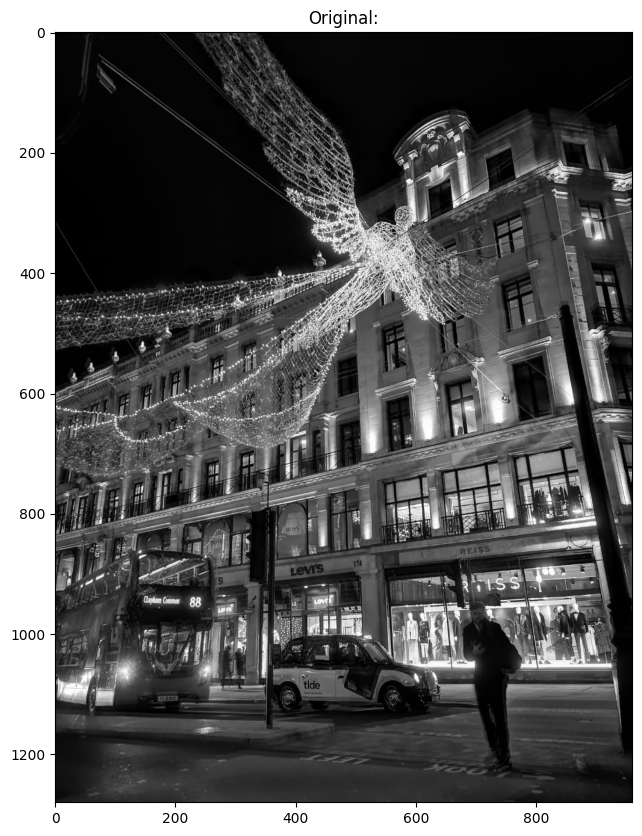

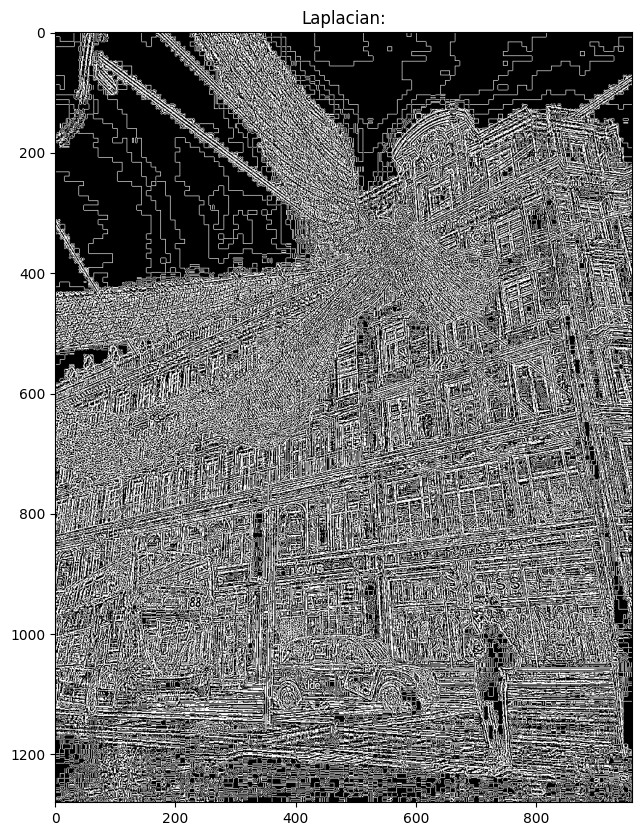

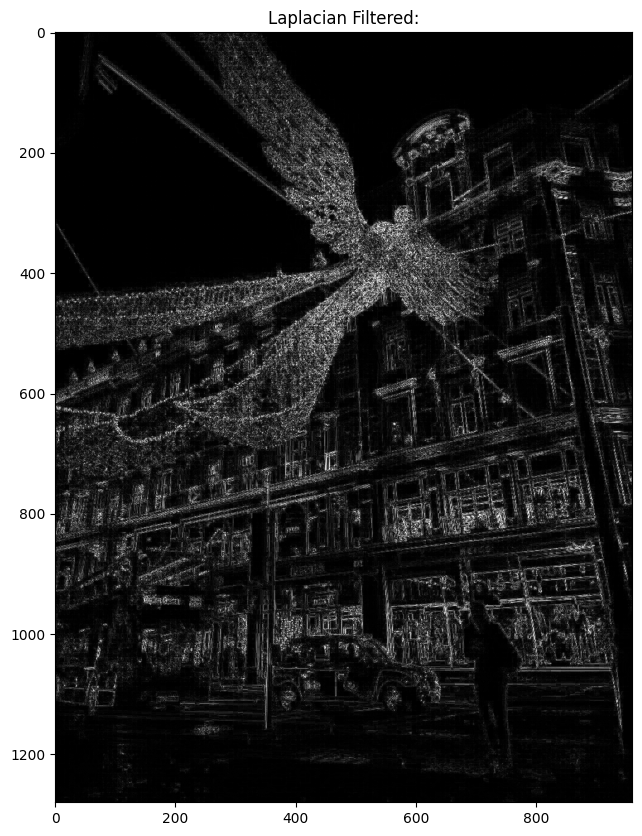

In [14]:
laplacian = cv2.Laplacian(image,5,cv2.CV_64F)
filtered_image = cv2.convertScaleAbs(laplacian)
imshow('Original:',image)
imshow('Laplacian:',laplacian)
imshow('Laplacian Filtered:',filtered_image)